In [1]:
import numpy as np
import matplotlib
import sys, platform, os
import matplotlib.cm as cm
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import astropy.io.fits as fits
import camb
from scipy.interpolate import interp1d

from camb import model, initialpower
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interactive, interact, fixed
from scipy.signal import convolve

from tqdm import tqdm
from tqdm.notebook import tqdm as tqdm_notebook  # Use an alias to avoid conflicts


%config InlineBackend.figure_format = 'retina'
%matplotlib inline

from PolAngle import *
from beam import * 
from map import *
from convolution import * 
from beam_class import *

# Power Spectra

In [2]:
#Set up a new set of parameters for CAMB
pars = camb.CAMBparams()
#This function sets up with one massive neutrino and helium set using BBN consistency
pars.set_cosmology(H0=67.5, ombh2=0.022, omch2=0.122, mnu=0.06, omk=0, tau=0.06)
pars.InitPower.set_params(As=2e-9, ns=0.965, r=0.001)
pars.set_for_lmax(2500, lens_potential_accuracy=0)
pars.WantTensors= True

#calculate results for these parameters
results = camb.get_results(pars)

#get dictionary of CAMB power spectra
powers = results.get_cmb_power_spectra(pars, CMB_unit='muK')
for name in powers: print(name)

totCL = powers['total']
unlensedCL = powers['unlensed_scalar']
tensor = powers['tensor']
print(totCL.shape)

ls = np.arange(totCL.shape[0])

# rinomino per comodità
TT_ps  = totCL[:,0] 
TE_ps  = totCL[:,3] 
EE_ps  = totCL[:,1] 
BB_ps  = totCL[:,2]
BB_ps_tensor  = tensor[:,2]

total
unlensed_scalar
unlensed_total
lensed_scalar
tensor
lens_potential
(2551, 4)


# Maps

In [3]:
# MAP PARAMETERS

pix_size         = 0.5                              #arcmin
N                = 2**10                            #num pixel lineare
X_width, Y_width = N*pix_size/60., N*pix_size/60.   #dimensioni mappa in gradi
Nsqdeg           = X_width**2

c_min, c_max     = -200, 200                        #color map


# If I want to start from a given map dimension instead of number and size of pixels I do:
#N = (X_width * 60)/ pix_size #pixel number

print(f"Map with {N} x {N} pixels, each of {pix_size} arcmin, for a total dimension of {X_width:.2f} x {Y_width:.2f} gradi")


nbig = 5000

Map with 1024 x 1024 pixels, each of 0.5 arcmin, for a total dimension of 8.53 x 8.53 gradi


In [4]:
# ORIGINAL MAPS

ell_big = np.arange(nbig)

TT_ps_big = np.zeros(nbig)
TT_ps_big[ls.astype(int)] = TT_ps

EE_ps_big = np.zeros(nbig)
EE_ps_big[ls.astype(int)] = EE_ps

BB_ps_big = np.zeros(nbig)
BB_ps_big[ls.astype(int)] = BB_ps

TE_ps_big = np.zeros(nbig)
TE_ps_big[ls.astype(int)] = TE_ps

ell    = ell_big
ps_TT  = TT_ps_big + 1e-3   
ps_EE  = EE_ps_big + 1e-3
ps_BB  = BB_ps_big + 1e-3
ps_TE  = TE_ps_big

Temp_point_source_spectrum = ps_TT[1000]*(ell/3000.)**2.
Pol_point_source_spectrum  = ps_EE[1500]*(ell/4500.)**2.

ps_TT = ps_TT + Temp_point_source_spectrum  
ps_EE = ps_EE + Pol_point_source_spectrum
ps_BB = ps_BB + Pol_point_source_spectrum



T_map, Q_map, U_map, E_map, B_map = make_CMB_maps(N,pix_size,ell,ps_TT,ps_EE,ps_TE,ps_BB)

## Beam + rings
Simulation of a realistic beam with a gaussian center peak and secondary peaks
https://github.com/McMahonCosmologyGroup/cmbInstrumentSummerSchool/blob/main/Notebook2_beam_systematics.ipynb

ellipticity =  -0.1111111111111111


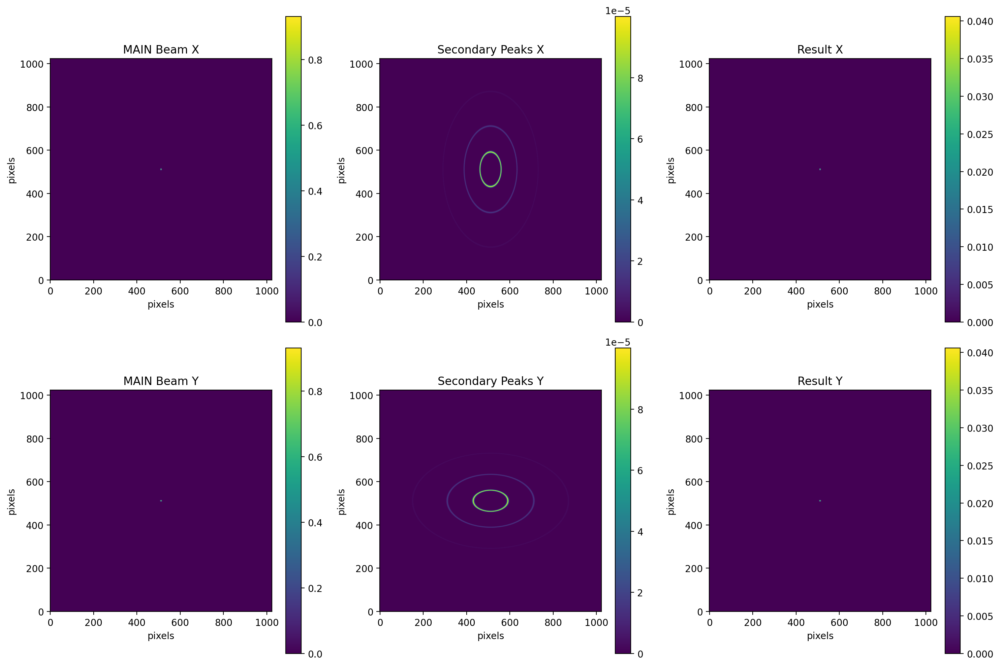

In [5]:
# COORDINATES LIKE THE ONES OF THE MAPS

N = int(N)
ones = np.ones(N)
inds = (np.arange(N)+.5 - N/2.) * pix_size
X = np.outer(ones,inds)
Y = np.transpose(X)
R = np.sqrt(X**2. + Y**2.)


#####################################################################################

# VARIABLES

FWHM_x = 4  # degrees
FWHM_y = 5  # degrees
ellipticity = (FWHM_x - FWHM_y) / (FWHM_x + FWHM_y)
print("ellipticity = ", ellipticity)

array_dB1 = np.array([-20, -24, -28, -32])  #max values of the secondary peaks
array_dB2 = array_dB1 * 1.5
array_dB3 = array_dB1 * 1.8
array_dB4 = array_dB1 * 2

r1 = np.array([20, 50, 90, 130]) #angular distance of the peaks
r = 2 # width of the rings

theta = 0 # angle of rotation of the beam
a = 1 # major axis of ellipses 


#########################################################################################

# BEAM

beam_gauss_x1, beam_gauss_y1, sec_rings_x1,sec_rings_y1, beam_x1, beam_y1 = create_beam_secpeaks(pix_size, FWHM_x, FWHM_y, theta, array_dB1, r, r1, X, Y, a, ellipticity)
beam_gauss_x2, beam_gauss_y2, sec_rings_x2,sec_rings_y2, beam_x2, beam_y2 = create_beam_secpeaks(pix_size, FWHM_x, FWHM_y, theta, array_dB2, r, r1, X, Y, a, ellipticity)
beam_gauss_x3, beam_gauss_y3, sec_rings_x3,sec_rings_y3, beam_x3, beam_y3 = create_beam_secpeaks(pix_size, FWHM_x, FWHM_y, theta, array_dB3, r, r1, X, Y, a, ellipticity)
beam_gauss_x4, beam_gauss_y4, sec_rings_x4,sec_rings_y4, beam_x4, beam_y4 = create_beam_secpeaks(pix_size, FWHM_x, FWHM_y, theta, array_dB4, r, r1, X, Y, a, ellipticity)

########################################################################################

# PLOT

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
titles = ['MAIN Beam X', 'Secondary Peaks X', 'Result X', 'MAIN Beam Y', 'Secondary Peaks Y', 'Result Y']
data_list = [beam_gauss_x4, sec_rings_x4, beam_x4, beam_gauss_y4, sec_rings_y4, beam_y4]

for i, ax in enumerate(axes.flat):
    im = ax.imshow(data_list[i], cmap='viridis', origin='lower')
    ax.set_title(titles[i])
    ax.set_xlabel('pixels')
    ax.set_ylabel('pixels')
    cbar = plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.show()

In [6]:
print(array_dB1)
print(array_dB2)
print(array_dB3)
print(array_dB4)

[-20 -24 -28 -32]
[-30. -36. -42. -48.]
[-36.  -43.2 -50.4 -57.6]
[-40 -48 -56 -64]


## Beam systematics
I will use beam_x for the convolution, so I add beam systematics to beam_x only

In [7]:
### beam systematics dictionary
bs = {"budy":{"A":1e-3,"FWHP":1.5,"R":50.,"psi":0.3,"polfracQ":0.5,"polfracU":0.01},  
                                                                         # little budy amplitude, 
                                                                         #FWHP, offset spacing, rotationa angle (radians)
                                                                        # pol_fraction for Q and U
     "ghostshelf": {"A":1e-10,"Diam":10.,"roll_off":7.},    #model of ghosting, amplitude (A), diameter (Diam) 
     "hex_crostalk":{"grid_space": 3.5,"N":5,"neighbor_exp_fall":0.01}, 
                                                                               ## model of optical cross talk 
                                                                               ## to detectors on a hex grid
                                                                               ## assumed to be exponetial
                                                                               ## assumed to be 50% polarized
      "TtoQ":{"mono":1e-3,"dip_x":1e-2,"dip_y":1e-2,"quad_x":1e-2,"quad_45":1e-2},
      "TtoU":{"mono":1e-3,"dip_x":1e-2,"dip_y":1e-2,"quad_x":1e-2,"quad_45":1e-2},
                                                                  ## multiplole expansion leakage
      'psi':0.01*np.pi/180.
                                  ## detetor angle rotations
                   }

In [8]:
beam_sys = BeamSystematics()
beam_TT1, beam_QQ1, beam_UU1, beam_QT1, beam_UT1, beam_QU1, beam_UQ1 = beam_sys.make_systematics_beams(N, pix_size, FWHM_x, beam_x1, bs)
beam_TT2, beam_QQ2, beam_UU2, beam_QT2, beam_UT2, beam_QU2, beam_UQ2 = beam_sys.make_systematics_beams(N, pix_size, FWHM_x, beam_x2, bs)
beam_TT3, beam_QQ3, beam_UU3, beam_QT3, beam_UT3, beam_QU3, beam_UQ3 = beam_sys.make_systematics_beams(N, pix_size, FWHM_x, beam_x3, bs)
beam_TT4, beam_QQ4, beam_UU4, beam_QT4, beam_UT4, beam_QU4, beam_UQ4 = beam_sys.make_systematics_beams(N, pix_size, FWHM_x, beam_x4, bs)

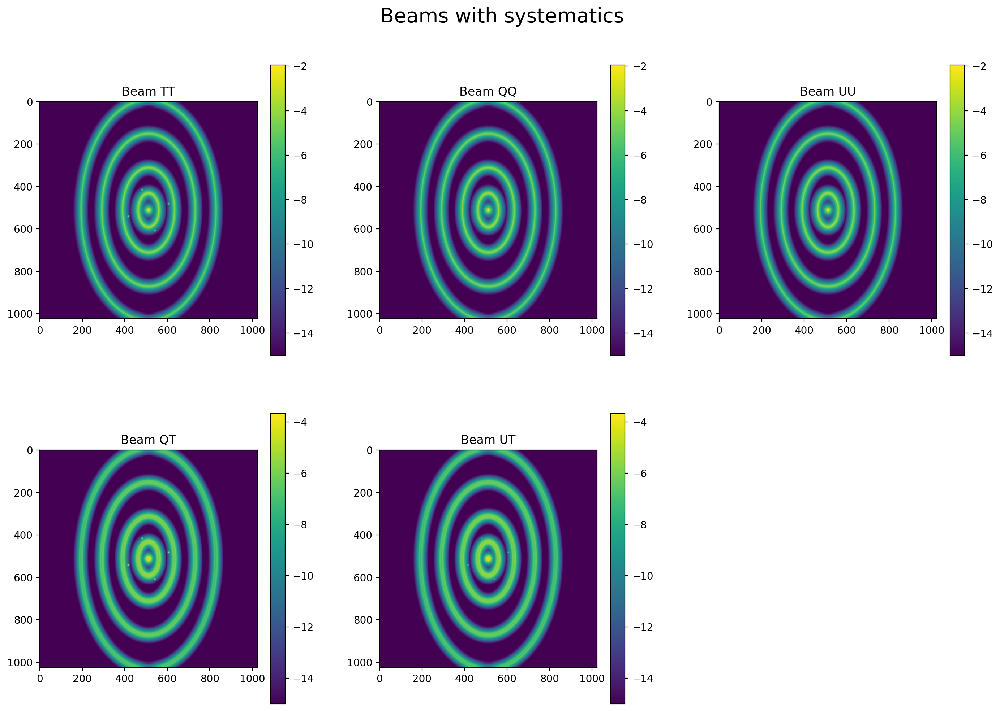

In [9]:
Map_to_Plot = [beam_TT1, beam_QQ1, beam_UU1, beam_QT1, beam_UT1]
title = ["Beam TT", "Beam QQ", "Beam UU", "Beam QT", "Beam UT" ]
c_factor_max = [np.max(Map_to_Plot[0]), np.max(Map_to_Plot[1]), np.max(Map_to_Plot[2]), np.max(Map_to_Plot[3]), np.max(Map_to_Plot[4])]
c_factor_min = [np.min(Map_to_Plot[0]), np.min(Map_to_Plot[1]), np.min(Map_to_Plot[2]), np.min(Map_to_Plot[3]), np.min(Map_to_Plot[4])]


fig, axs = plt.subplots(2, 3, figsize=(14, 10))
axs      = axs.flatten()
for i, (map_data, c_factor_iter_min, c_factor_iter_max) in enumerate(zip(Map_to_Plot, c_factor_min, c_factor_max)):
    im = axs[i].imshow(np.log10(map_data+1e-15))
    axs[i].set_title(title[i])
    plt.colorbar(im, ax=axs[i], orientation='vertical')
    
fig.delaxes(axs[-1])
plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle(f'Beams with systematics', fontsize=20)
plt.show()

## Convolve the beam with the maps

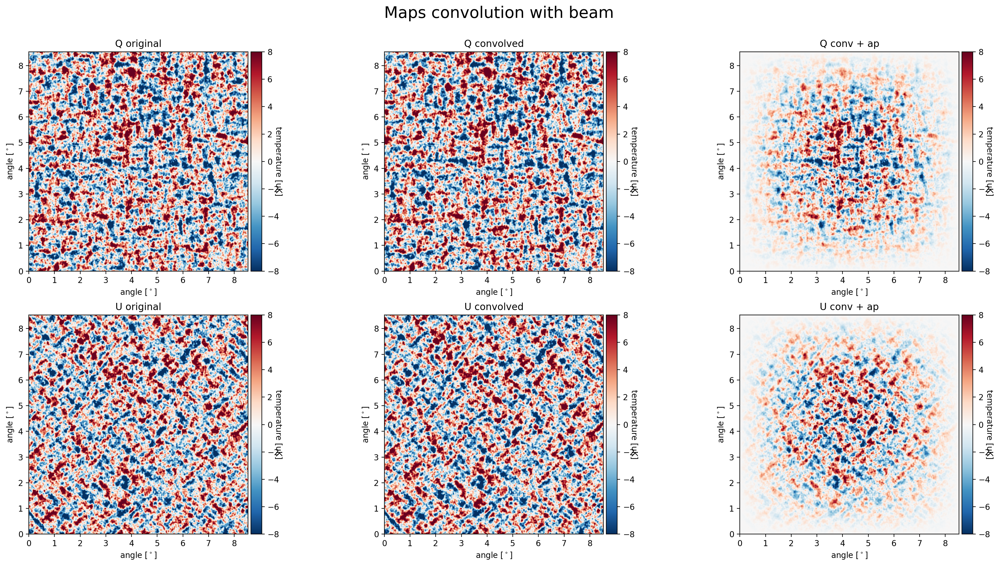

In [10]:
## MAPS IN THE REAL SPACE

# convolution with perfect beam
perf_beam, no1, no2, no3, no4, no5 = create_beam_secpeaks(pix_size, FWHM_x, FWHM_y, 0, array_dB1, r, r1, X, Y, a, ellipticity)
perf_beam = perf_beam / np.sum(perf_beam)

Q_conv_perf = convolve_map_with_beam(Q_map, perf_beam)
U_conv_perf = convolve_map_with_beam(U_map, perf_beam)


# convolution with real beam
Q_conv_real1 = convolve_map_with_beam(Q_map, beam_QQ1)
U_conv_real1 = convolve_map_with_beam(U_map, beam_UU1)

Q_conv_real2 = convolve_map_with_beam(Q_map, beam_QQ2)
U_conv_real2 = convolve_map_with_beam(U_map, beam_UU2)

Q_conv_real3 = convolve_map_with_beam(Q_map, beam_QQ3)
U_conv_real3 = convolve_map_with_beam(U_map, beam_UU3)

Q_conv_real4 = convolve_map_with_beam(Q_map, beam_QQ4)
U_conv_real4 = convolve_map_with_beam(U_map, beam_UU4)


# apodization
window = (cosine_window(N))
Q_conv_ap1 = window * Q_conv_real1
U_conv_ap1 = window * U_conv_real1

Q_conv_ap2 = window * Q_conv_real2
U_conv_ap2 = window * U_conv_real2

Q_conv_ap3 = window * Q_conv_real3
U_conv_ap3 = window * U_conv_real3

Q_conv_ap4 = window * Q_conv_real4
U_conv_ap4 = window * U_conv_real4



# plot
Map_to_Plot = [Q_conv_perf, Q_conv_real4,Q_conv_ap4, U_conv_perf, U_conv_real4 ,U_conv_ap4]
title = ["Q original","Q convolved","Q conv + ap", "U original","U convolved", "U conv + ap"]
c_factor = [25, 25, 25,25, 25,25]

fig, axs = plt.subplots(2, 3, figsize=(18, 10))
axs      = axs.flatten()
for i, (map_data, c_factor_iter) in enumerate(zip(Map_to_Plot, c_factor)):
        Plot_CMB_Map_compact(axs[i], map_data, c_min/c_factor_iter, c_max/c_factor_iter, X_width, Y_width)
        axs[i].set_title(title[i])

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle('Maps convolution with beam', fontsize=20)
plt.show()

### Deconvolution

In [11]:
def deconvolve_map(convolved_map, real_beam, perfect_beam):
    from scipy.fft import fft2, ifft2

    convolved_map_fft = np.fft.fft2(np.fft.fftshift(convolved_map))
    real_beam_fft     =  np.fft.fft2(np.fft.fftshift(real_beam))
    real_beam_fft    += 1e-22
    perfect_beam_fft  =  np.fft.fft2(np.fft.fftshift(perfect_beam))

    deconvolved_fft = convolved_map_fft * (perfect_beam_fft/ real_beam_fft)

    deconvolved_map = np.fft.fftshift(np.real(np.fft.ifft2(deconvolved_fft)))


    return deconvolved_map

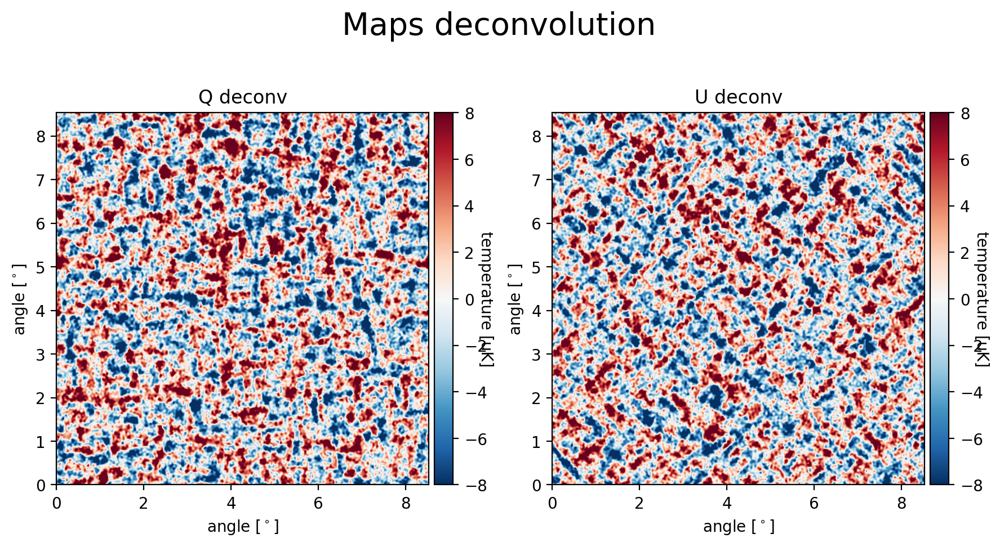

In [12]:
Q_deconv1 = correct_lr(Q_conv_ap1/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)
U_deconv1 = correct_lr(U_conv_ap1/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)

Q_deconv2 = correct_lr(Q_conv_ap2/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)
U_deconv2 = correct_lr(U_conv_ap2/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)

Q_deconv3 = correct_lr(Q_conv_ap3/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)
U_deconv3 = correct_lr(U_conv_ap3/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)

Q_deconv4 = correct_lr(Q_conv_ap4/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)
U_deconv4 = correct_lr(U_conv_ap4/window, perf_beam,N, pix_size, 'onestep', None, 1e-10, 1e-12, None, 50)

Map_to_Plot = [Q_deconv4, U_deconv4]
title = ["Q deconv","U deconv"]
c_factor = [25, 25]

fig, axs = plt.subplots(1, 2, figsize=(9, 5))
axs      = axs.flatten()
for i, (map_data, c_factor_iter) in enumerate(zip(Map_to_Plot, c_factor)):
        Plot_CMB_Map_compact(axs[i], map_data, c_min/c_factor_iter, c_max/c_factor_iter, X_width, Y_width)
        axs[i].set_title(title[i])

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
plt.suptitle('Maps deconvolution', fontsize=20)
plt.show()

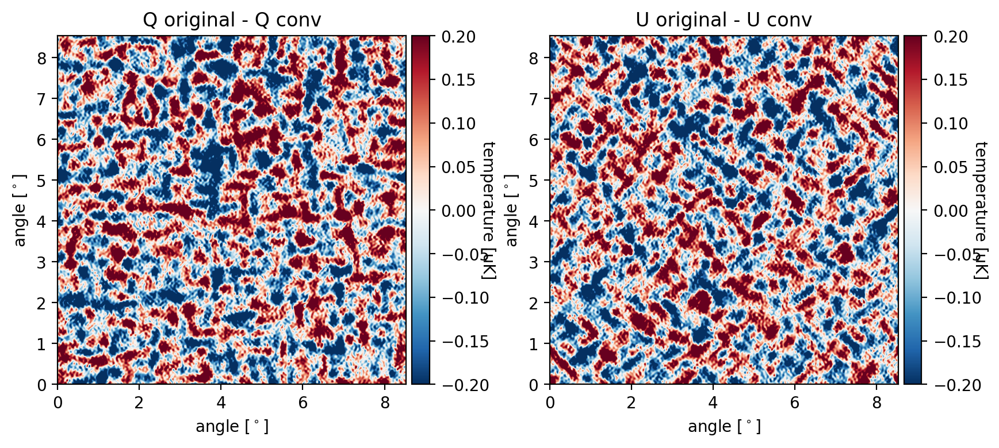

In [13]:
# DIFFERENCE
Q_diff1 = (Q_conv_perf- Q_deconv1)
U_diff1 = (U_conv_perf- U_deconv1)

Q_diff2 = (Q_conv_perf- Q_deconv2)
U_diff2 = (U_conv_perf- U_deconv2)

Q_diff3 = (Q_conv_perf- Q_deconv3)
U_diff3 = (U_conv_perf- U_deconv3)

Q_diff4 = (Q_conv_perf- Q_deconv4)
U_diff4 = (U_conv_perf- U_deconv4)

#####################################################################
Map_to_Plot = [(Q_diff4), (U_diff4)]
title = ["Q original - Q conv","U original - U conv"]
c_factor = [1e3, 1e3]

fig, axs = plt.subplots(1, 2, figsize=(9, 4))
axs      = axs.flatten()
for i, (map_data, c_factor_iter) in enumerate(zip(Map_to_Plot, c_factor)):
        Plot_CMB_Map_compact(axs[i], map_data, c_min/c_factor_iter, c_max/c_factor_iter, X_width, Y_width)
        axs[i].set_title(title[i])

plt.tight_layout()
plt.subplots_adjust(wspace=0.25, hspace=0.2, top=0.90)
#plt.suptitle('Maps deconvolution', fontsize=20)
plt.show()

### From QU to EB

In [14]:
# conversion of Q and U deconvolved maps in E and B maps. I also convert Qdiff and Udiff in order to compute the power spectra of the difference
#E_deconv, B_deconv = QU2EB(N,pix_size,Q_deconv,U_deconv)
#E_diff, B_diff     = QU2EB(N,pix_size,Q_diff,U_diff)
#E_conv, B_conv     = QU2EB(N,pix_size,Q_conv_perf,U_conv_perf)

E_diff1, B_diff1     = QU2EB(N,pix_size,Q_diff1,U_diff1)
E_diff2, B_diff2     = QU2EB(N,pix_size,Q_diff2,U_diff2)
E_diff3, B_diff3     = QU2EB(N,pix_size,Q_diff3,U_diff3)
E_diff4, B_diff4     = QU2EB(N,pix_size,Q_diff4,U_diff4)

### PS

In [15]:
delta_l = 50.
l_max   = 2500

# Power spectra deconvolved maps
#binned_l_E_deconv, binned_spectrum_E_deconv = calculate_2d_spectrum(E_deconv,E_deconv,delta_l,l_max,pix_size,N)
#binned_l_B_deconv, binned_spectrum_B_deconv = calculate_2d_spectrum(B_deconv,B_deconv,delta_l,l_max,pix_size,N)

# Power spectra difference maps - to obtain the side lobes
#binned_l_Ediff, binned_spectrum_Ediff = calculate_2d_spectrum(E_diff,E_diff,delta_l,l_max,pix_size,N)
#binned_l_Bdiff, binned_spectrum_Bdiff = calculate_2d_spectrum(B_diff,B_diff,delta_l,l_max,pix_size,N)

# Power spectra of maps convolved with a perfect beam to compare better with the deconvolved power spectra
#binned_l_E_conv, binned_spectrum_E_conv = calculate_2d_spectrum(E_conv,E_conv,delta_l,l_max,pix_size,N)
#binned_l_B_conv, binned_spectrum_B_conv = calculate_2d_spectrum(B_conv,B_conv,delta_l,l_max,pix_size,N)


binned_l_Ediff1, binned_spectrum_Ediff1 = calculate_2d_spectrum(E_diff1,E_diff1,delta_l,l_max,pix_size,N)
binned_l_Bdiff1, binned_spectrum_Bdiff1 = calculate_2d_spectrum(B_diff1,B_diff1,delta_l,l_max,pix_size,N)

binned_l_Ediff2, binned_spectrum_Ediff2 = calculate_2d_spectrum(E_diff2,E_diff2,delta_l,l_max,pix_size,N)
binned_l_Bdiff2, binned_spectrum_Bdiff2 = calculate_2d_spectrum(B_diff2,B_diff2,delta_l,l_max,pix_size,N)

binned_l_Ediff3, binned_spectrum_Ediff3 = calculate_2d_spectrum(E_diff3,E_diff3,delta_l,l_max,pix_size,N)
binned_l_Bdiff3, binned_spectrum_Bdiff3 = calculate_2d_spectrum(B_diff3,B_diff3,delta_l,l_max,pix_size,N)

binned_l_Ediff4, binned_spectrum_Ediff4 = calculate_2d_spectrum(E_diff4,E_diff4,delta_l,l_max,pix_size,N)
binned_l_Bdiff4, binned_spectrum_Bdiff4 = calculate_2d_spectrum(B_diff4,B_diff4,delta_l,l_max,pix_size,N)

In [16]:
array_dB1

array([-20, -24, -28, -32])

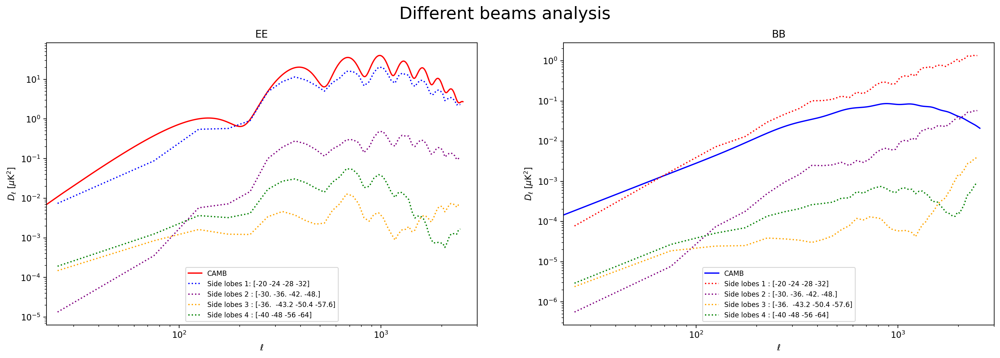

In [17]:
fig, ax = plt.subplots(1,2, figsize = (20,6))

# EE
ax[0].loglog(ls,EE_ps, label="CAMB", c="r", linewidth=1.5)
ax[0].loglog(binned_l_Ediff1, binned_spectrum_Ediff1* binned_l_Ediff1 * (binned_l_Ediff1+1.)/2. / np.pi,color='blue', linestyle=":", label=f"Side lobes 1: {array_dB1}")
ax[0].loglog(binned_l_Ediff2, binned_spectrum_Ediff2* binned_l_Ediff2 * (binned_l_Ediff2+1.)/2. / np.pi,color='purple', linestyle=":", label=f"Side lobes 2 : {array_dB2}")
ax[0].loglog(binned_l_Ediff3, binned_spectrum_Ediff3* binned_l_Ediff3 * (binned_l_Ediff3+1.)/2. / np.pi,color='orange', linestyle=":", label=f"Side lobes 3 : {array_dB3}")
ax[0].loglog(binned_l_Ediff4, binned_spectrum_Ediff4* binned_l_Ediff4 * (binned_l_Ediff4+1.)/2. / np.pi,color='green', linestyle=":", label=f"Side lobes 4 : {array_dB4}")
ax[0].set_title("EE")
ax[0].legend(loc="lower center", fontsize= 8)
ax[0].set_xlim(22,3000)

#BB
ax[1].loglog(ls,BB_ps, label="CAMB", c="b", linewidth=1.5)
ax[1].loglog(binned_l_Bdiff1, binned_spectrum_Bdiff1* binned_l_Bdiff1 * (binned_l_Bdiff1+1.)/2. / np.pi,color='red', linestyle=":", label=f"Side lobes 1 : {array_dB1}")
ax[1].loglog(binned_l_Bdiff2, binned_spectrum_Bdiff2* binned_l_Bdiff2 * (binned_l_Bdiff2+1.)/2. / np.pi,color='purple', linestyle=":", label=f"Side lobes 2 : {array_dB2}")
ax[1].loglog(binned_l_Bdiff3, binned_spectrum_Bdiff3* binned_l_Bdiff3 * (binned_l_Bdiff3+1.)/2. / np.pi,color='orange', linestyle=":", label=f"Side lobes 3 : {array_dB3}")
ax[1].loglog(binned_l_Bdiff4, binned_spectrum_Bdiff4* binned_l_Bdiff4 * (binned_l_Bdiff4+1.)/2. / np.pi,color='green', linestyle=":", label=f"Side lobes 4 : {array_dB4}")
ax[1].set_title("BB")
ax[1].legend(loc="lower center", fontsize= 8)
ax[1].set_xlim(22,3000)

for ax in ax.reshape(-1): 
    ax.set_xlabel(r'$\ell$')
    ax.set_ylabel('$D_{\ell}$ [$\mu$K$^2$]')

#plt.savefig('/Users/guide/Documents/University/TESI/immagini/SideLobes.png')
plt.suptitle("Different beams analysis", fontsize=20)
plt.show()